# Correlated Nash equilibria payoff sets
**Vitor Farinha Luz**

Finds all possible correlated equilibria in a finite grid and plots the related payoffs.\
It uses two separate methods:
1. Polytope - Exact method using linear algebra and polytopes (from `src/Games_src.jl` file). Works for any finite 2-player game.
1. Grid - Simpler method using a finite grid on the space of joint action distributions for 2x2 games.

In [1]:
#Loads code for calculations and plots:
include("src/Games_src.jl")
using .NormalForms, Plots

___
## Polytope method (Finite 2-player games)

The code below uses a specifid 2-player normal form and plots its correlated equilibria set.
The construction starts with an array of payoffs, then creates a "NormalForm" object which has been defined in the backgroud and can be used for calculations and plots.

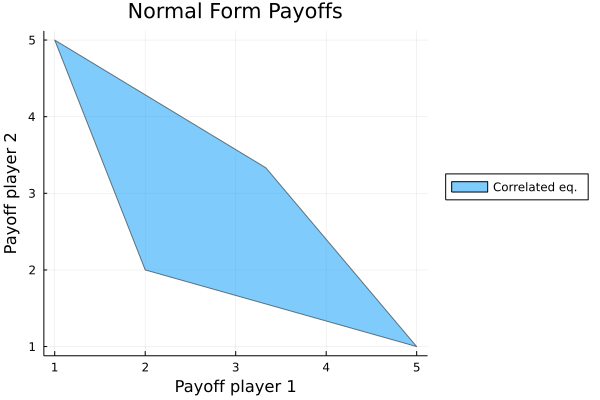

In [2]:
#The following matrix can be updated:
normalTable=[
    (5.,1.) (0.,0.);
   (4.,4.) (1.,5.)
]

normalform=NormalForm(normalTable) #Constructs NormalForm object

p=plotCorrelated(normalform) #Plots CE set

The code below includes the Nash equilibria payoffs in the plot.
The current code does not calculate NE payoffs. These have been calculated outside of this program.

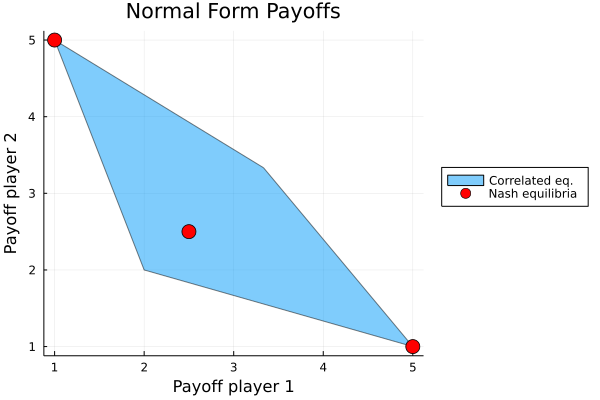

In [3]:
p=scatter!(p,[5,1,2.5],[1,5,2.5],
color=:red,
markersize=8,
label="Nash equilibria")

The following adds the minimax payoff profile.

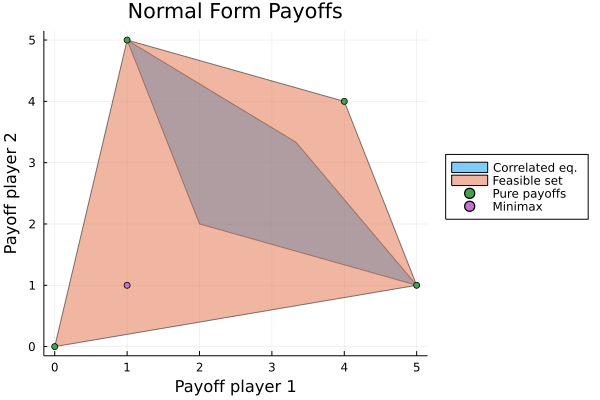

In [4]:
p=plotCorrelated(normalform) #Plots CE set
p=plotFeasible2!(p, normalform)
p=NormalForms.plotMinimax2!(p, normalform)

### Random 3x3 two-player game:
The following code randomly generates a random 3x3 two-player game and plots its CE payoff set.

"The payoff table(s) for the random game is:"

3×3 Matrix{Tuple{Float64, Float64}}:
 (0.39, 0.25)  (0.57, 0.7)   (0.0, 0.77)
 (0.15, 0.34)  (0.72, 0.16)  (1.0, 0.93)
 (0.87, 0.7)   (0.46, 0.27)  (0.47, 0.21)

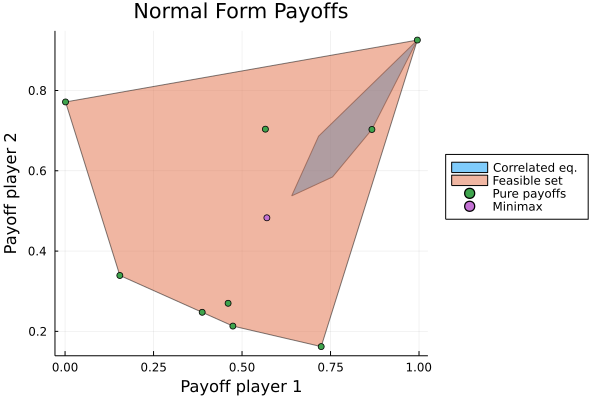

In [9]:
normalform=randomNormalForm((3,3));

p=plotCorrelated(normalform) #Plot CE set
p=plotFeasible2!(p,normalform) #Plot feasible set
p=NormalForms.plotMinimax2!(p, normalform) #Plot minimax profile

___
## Grid algorithm - special 2x2 game

This code plots the correlated equilibria for the following normal form game:

 
 
|         |         |
| ------- | --------|
| (5.,1.) | (0.,0.) |
| (4.,4.) | (1.,5.) |

It uses a finite grid over the set of possible acton distributions and checks if any of them is a CE.

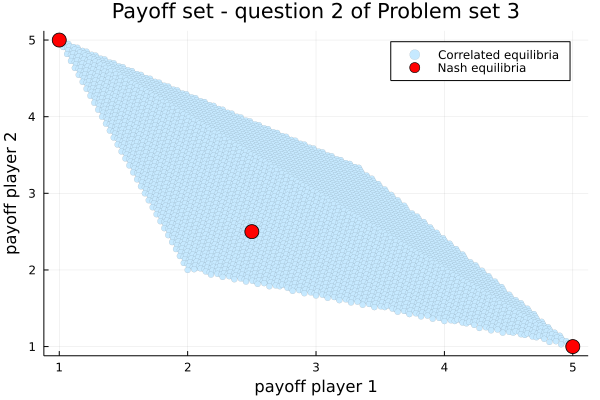

In [7]:
# Creating a finite grid of possible probabilities for each action profile:
ngrid=100
P=LinRange(0,1,ngrid)
Q=LinRange(0,1,ngrid)
R=LinRange(0,1,ngrid)

# Going over all possible combinations of probabilities to check whether it corresponds to a Correlated equilibrium
#  and, if so, save the connected payoffs

payoffList=Vector{Tuple}() #Empty vector to be filled

for p in P, q in Q, r in R
    if (
        p+q+r ≤1 && # Probability 1-p-q is in [0,1]

        5*p ≥ 4*p + 1*q && # Player 1 U incentive

        4*r + (1-p-q-r) ≥ 5*r && # Player 1 D incentive

        1*p + 4*r ≥ 5*r && # Player 2 L incentive

        5*(1-p-q-r) ≥ 1*q + 4*(1-p-q-r) # Player 2 R incentive
        )
        
        #Calculate equilibrium payoff profile and stores it
        push!(payoffList,
        p.*(5,1) .+ q.*(0,0) .+r.*(4,4) .+ (1 .-p .-q .-r).*(1,5)
        ) 
    end
end

#Turns this list of payoffs into a matrix for plotting
payoffMat=[payoffList[i][j] for i in 1:size(payoffList,1), j in [1,2]]

#Plotting correlated equilibria payoffs:
p1=scatter(payoffMat[:,1],payoffMat[:,2],
color=colorant"#C6E9FF",
markerstrokewidth=0,
label="Correlated equilibria",
xlabel="payoff player 1",
ylabel="payoff player 2",
title="Payoff set - question 2 of Problem set 3")

#Adding Nash equilibrium payoffs:
p1=scatter!([5,1,2.5],[1,5,2.5],
color=:red,
markersize=8,
label="Nash equilibria")